In [1]:
import os, sys
sys.path.append(os.path.dirname(os.getcwd()))

from glob import glob
import math
from pprint import pprint
import torch

import pygarment as pyg
import numpy as np
import matplotlib.pyplot as plt
import json
from matplotlib.colors import CenteredNorm
import time

import plotly.graph_objects as go
import trimesh
import pickle
from PIL import Image
import random
import cv2

from analysis_utils import v_id_map, visualize_meshes_plotly, plot_panel_info

In [2]:
render_props = {
    "resolution": [800, 800],
    "sides": ["front", "right", "back", "left"],
    "front_camera_location": [0, 0.97, 4.15],
    "uv_texture": {
        "seam_width": 0.5,
        "dpi": 1500,
        "fabric_grain_texture_path": "./assets/img/fabric_texture.png",
        "fabric_grain_resolution": 5
    }
}

IMG_WIDTH = 800
IMG_HEIGHT = 800

X_MIN_LIST = [150, 200, 150, 200]
WIDTH_LIST = [500, 400, 500, 400]

Y_MIN_LIST = [100, 100, 100, 100]
HEIGHT_LIST = [700, 700, 700, 700]

X_OFFSET_LIST = [0, 500, 0, 500]
Y_OFFSET_LIST = [0, 0, 700, 700]


FIG_LEN = 5
NCOLS = len(render_props["sides"])
NROWS = 2


In [3]:

PROJECT_ROOT_PATH = "/media/hjp/05aba9a7-0e74-4e54-9bc9-5f11b9c4c757/GarmentCodeData/"
GARMENT_ROOT_PATH = os.path.join(PROJECT_ROOT_PATH, "GarmentCodeData_v2")
BODY_ROOT_PATH = os.path.join(PROJECT_ROOT_PATH, "body_mesh")
MEAN_ALL_BODY_PATH = os.path.join(PROJECT_ROOT_PATH, "neutral_body/mean_all.obj")

default_body_mesh = trimesh.load(MEAN_ALL_BODY_PATH)




IDX = 1000


# BODY_TYPE = "random_body"
BODY_TYPE = "default_body"

garment_path = sorted(list(filter(
    os.path.isdir,
    glob(os.path.join(GARMENT_ROOT_PATH, "*", BODY_TYPE, "*"))
)))[IDX]
# garment_path = "/media/hjp/05aba9a7-0e74-4e54-9bc9-5f11b9c4c757/GarmentCodeData/GarmentCodeData_v2/garments_5000_0/default_body/rand_0AAY3NQH8J"
# garment_path = "/media/hjp/05aba9a7-0e74-4e54-9bc9-5f11b9c4c757/GarmentCodeData/GarmentCodeData_v2/garments_5000_0/default_body/rand_0BD28UCVO8"

garment_id = os.path.basename(garment_path)

SPEC_FILE_PATH = os.path.join(garment_path, f"{garment_id}_specification.json")
pattern = pyg.pattern.wrappers.VisPattern(SPEC_FILE_PATH)

panel_svg_path_dict = {
    panel_name : pattern._draw_a_panel(
        panel_name, apply_transform=False, fill=True
    )
    for panel_name in pattern.panel_order()
}
stitch_dict = {
    i : v for i, v in enumerate(pattern.pattern['stitches'])
}



simulated_garment_mesh = trimesh.load_mesh(
    os.path.join(garment_path, f"{garment_id}_sim.ply"),
    process=False
)
simulated_garment_mesh.vertices = simulated_garment_mesh.vertices / 100

idx_convert_map = np.array(
    v_id_map(simulated_garment_mesh.vertices)
)



with open(os.path.join(garment_path, f"{garment_id}_sim_segmentation.txt"), "r") as f:
    segmentation = list(map(
        lambda x : x.strip(),
        f.readlines()
    ))

panel_vertex_mask_dict = {}
for k in panel_svg_path_dict.keys():
    raw_mask = list(map(
        lambda x : True if x.startswith(k) else False,
        segmentation
    ))
    panel_vertex_mask_dict[k] = np.array(list(map(
        lambda idx : True if raw_mask[idx] else False,
        idx_convert_map
    )))

stitch_vertex_mask_dict = {}
for k in stitch_dict.keys():
    raw_mask = list(map(
        lambda x : True if f"stitch_{k}" in x.split(",") else False,
        segmentation
    ))
    base_mask = np.array(list(map(
        lambda idx : True if raw_mask[idx] else False,
        idx_convert_map
    )))
    stitch_vertex_mask_dict[k] = base_mask


rendered_image_list = list(map(
    lambda x : Image.open(os.path.join(
        garment_path, f"{garment_id}_render_{x}.png"
    )),
    render_props["sides"]
))

depth_image_list = list(map(
    lambda side : np.load(os.path.join(
        garment_path, f"{garment_id}_depth_{side}.npy"
    )),
    render_props["sides"]
))

projected_vertices_pose_dict = json.load(open(
    os.path.join(garment_path, f"{garment_id}_projected_vertex_pose.json"),
    "r"
))

vertex_visibility_mask_dict = json.load(open(
    os.path.join(garment_path, f"{garment_id}_vertex_visibility_mask.json"),
    "r"
))

In [4]:
# visible 한 vertex가 순차적으로 이어지는지

In [5]:
print(stitch_vertex_mask_dict[0].shape)
print(np.array(projected_vertices_pose_dict["front"]).shape)
print(np.array(vertex_visibility_mask_dict["front"]).shape)

(4610,)
(4610, 2)
(4610,)


In [6]:
np.array(projected_vertices_pose_dict["front"]).shape

for side in render_props["sides"]:
    proj_vert_pos_arr = np.array(projected_vertices_pose_dict[side])
    vert_vis_mask_arr = np.array(vertex_visibility_mask_dict[side])
    
    
    

In [7]:
simulated_garment_mesh.vertices[1] == simulated_garment_mesh.vertices[2]

TrackedArray([ True,  True,  True])

In [8]:
np.array(idx_convert_map).max(), len(idx_convert_map)

(4283, 4610)

In [9]:
QUERY_VERTEX_IDX = idx_convert_map.max()
QUERY_VERTEX_IDX = 5
same_vertex_idx_list = []



filtered_vertex_idx = idx_convert_map[QUERY_VERTEX_IDX]

same_vertex_idx_list = np.where(
    np.array(idx_convert_map) == filtered_vertex_idx
)[0]
print("QUERY_VERTEX_IDX    ", QUERY_VERTEX_IDX)
print("filtered_vertex_idx ", filtered_vertex_idx)
print("same_vertex_idx_list", same_vertex_idx_list)

print(idx_convert_map[same_vertex_idx_list])
print(idx_convert_map[QUERY_VERTEX_IDX])
print(idx_convert_map[:QUERY_VERTEX_IDX + 1])

QUERY_VERTEX_IDX     5
filtered_vertex_idx  3
same_vertex_idx_list [5 6]
[3 3]
3
[0 1 1 2 2 3]


In [10]:
QUERY_VERTEX_IDX = idx_convert_map.max()
QUERY_VERTEX_IDX = 5
same_vertex_idx_list = []



filtered_vertex_idx = idx_convert_map[QUERY_VERTEX_IDX]

same_vertex_idx_list = np.where(
    np.array(idx_convert_map) == filtered_vertex_idx
)[0]
print("QUERY_VERTEX_IDX    ", QUERY_VERTEX_IDX)
print("filtered_vertex_idx ", filtered_vertex_idx)
print("same_vertex_idx_list", same_vertex_idx_list)

print(idx_convert_map[same_vertex_idx_list])
print(idx_convert_map[QUERY_VERTEX_IDX])
print(idx_convert_map[:QUERY_VERTEX_IDX + 1])

QUERY_VERTEX_IDX     5
filtered_vertex_idx  3
same_vertex_idx_list [5 6]
[3 3]
3
[0 1 1 2 2 3]


In [11]:
idx_convert_map[:QUERY_VERTEX_IDX + 1]

array([0, 1, 1, 2, 2, 3])

In [15]:
vertices = simulated_garment_mesh.vertices[[53, 165]]
vertices = simulated_garment_mesh.vertices[
    stitch_vertex_mask_dict[6]
]

visualize_meshes_plotly(
    [simulated_garment_mesh],
    color_list=["lightgray"],
    show_edges=True,
    vertices_list=[
        vertices
    ],
    vertices_color_list=["red"],
    vertex_marker_size=5
)

In [13]:
edge = np.array(simulated_garment_mesh.edges)

for stitch_idx in stitch_vertex_mask_dict.keys():
    vetex_map = stitch_vertex_mask_dict[stitch_idx]
    
    print("stitch_idx", stitch_idx)
    
    vertices_idx_arr = np.where(vetex_map)[0]
    
    
    
    filtered_vertex_idx_list = []
    equivalent_vert_idx_list = []
    
    for vertex_idx in vertices_idx_arr:
        query_vertex_idx = vertex_idx
        filtered_vertex_idx = idx_convert_map[query_vertex_idx]
        same_vertex_idx_list = np.where(
            np.array(idx_convert_map) == filtered_vertex_idx
        )[0]
        filtered_vertex_idx_list.append(filtered_vertex_idx)
        equivalent_vert_idx_list.append(same_vertex_idx_list)        
    
    
    
    edge_exist_list = []
    
    for stt, end in zip(vertices_idx_arr[:-1], vertices_idx_arr[1:]):
        
        stt_equal_vert_idx_list = np.where(
            idx_convert_map == idx_convert_map[stt]
        )[0]
        end_equal_vert_idx_list = np.where(
            idx_convert_map == idx_convert_map[end]
        )[0]
        
        val = False
        for stt_equal_vert_idx in stt_equal_vert_idx_list:
            for end_equal_vert_idx in end_equal_vert_idx_list:
                edge_idx = np.where(
                    np.logical_or(
                        simulated_garment_mesh.edges == [stt_equal_vert_idx, end_equal_vert_idx],
                        simulated_garment_mesh.edges == [end_equal_vert_idx, stt_equal_vert_idx],
                    ).sum(axis=1) == 2
                )[0]
                if len(edge_idx) > 0:
                    val = True
                    break
        edge_exist_list.append(val)
        
    equal_vert_as_next_list = list(map(
        lambda x, y : np.allclose(x, y),
        simulated_garment_mesh.vertices[vertices_idx_arr[:-1]],
        simulated_garment_mesh.vertices[vertices_idx_arr[1:]]
    ))
    
    
    is_connected_vertex_list = np.logical_or(
        edge_exist_list,
        equal_vert_as_next_list
    )
    
    print(
        f'{"vertices_idx_arr":<22}',
        ",".join(
            list(map(
                lambda x : f"{x:4}",
                vertices_idx_arr.tolist()
            ))
        )
    )
    
    print(
        f'{"reduced_vert_idx_list":<22}',
        ",".join(
            list(map(
            lambda x : f"{x:4}",
            filtered_vertex_idx_list
        ))
    ))
    print(
        f'{"same as next":<22}',
        ",".join(
            list(map(
                lambda x : "   T" if x else "   F",
                equal_vert_as_next_list
            ))
        ),
    )
    
    print(
        f"{'edge_exist_list':<22}",
        ",".join(
            list(map(
                lambda x : "   T" if x else "   F",
                edge_exist_list
            ))
        )
    )


    print(
        f"{'is connected vertex':<22}",
        ",".join(
            list(map(
                lambda x : "   T" if x else "   F",
                is_connected_vertex_list
            ))
        )   
    )

    print(
        len(is_connected_vertex_list),
        np.array(is_connected_vertex_list).sum()
    )
    if len(is_connected_vertex_list) != np.array(is_connected_vertex_list).sum():
        print("=" * 100)
    print()
    
    

stitch_idx 0
vertices_idx_arr          0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,  14,  15,  16,  17,  18,  19,  20,  21,  22
reduced_vert_idx_list     0,   1,   1,   2,   2,   3,   3,   4,   4,   5,   5,   6,   6,   7,   7,   8,   8,   9,   9,  10,  10,  11,  11
same as next              F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T
edge_exist_list           T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F
is connected vertex       T,   T,   T,   T,   T,   T,   T,   T,   T,   T,   T,   T,   T,   T,   T,   T,   T,   T,   T,   T,   T,   T
22 22

stitch_idx 1
vertices_idx_arr         23,  24,  25,  26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49
reduced_vert_idx_list    12,  13,  13,  14,  14,  15,  15,  16,  16,  17,  17,  18,  18,  19,  19,  20,  20,  21,  21,  22,  22,  23, 

vertices_idx_arr        161, 162, 163, 164, 326, 327, 328, 329, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 394, 395, 396, 397, 398, 399, 400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415
reduced_vert_idx_list    81,  81,  81,  81, 162, 162, 162, 162, 189, 189, 190, 190, 191, 191, 192, 192, 193, 193, 194, 194, 195, 195, 196, 196, 197, 197, 198, 198, 199, 199, 200, 200, 201, 201, 202, 202, 203, 203, 204, 204, 205, 205, 206, 206
same as next              T,   T,   T,   F,   T,   T,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T
edge_exist_list           F,   F,   F,   F,   F,   F,   F,   F,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F,   T,   F
is connected vertex       T,   T,   T,

In [131]:
QUERY_VERTEX_IDX = 2
simulated_garment_mesh.edges[
    np.where(
        np.logical_or(
            simulated_garment_mesh.edges[:, 0] == QUERY_VERTEX_IDX,
            simulated_garment_mesh.edges[:, 1] == QUERY_VERTEX_IDX
        )
    )
]

array([[1018,    2],
       [   2, 1335],
       [   2, 1018],
       [   3,    2],
       [1335,    2],
       [   2,    0]])

In [139]:
QUERY_VERTEX_IDX = 4
simulated_garment_mesh.edges[
    np.where(
        np.logical_or(
            simulated_garment_mesh.edges[:, 0] == QUERY_VERTEX_IDX,
            simulated_garment_mesh.edges[:, 1] == QUERY_VERTEX_IDX
        )
    )
]

array([[   4, 1060],
       [1237,    4],
       [   4,    5],
       [1060,    4],
       [   1,    4],
       [   4, 1237]])

In [160]:
QUERY_VERTEX_IDX = 1
np.where(np.array(idx_convert_map) == QUERY_VERTEX_IDX)[0]

array([1, 2])

In [157]:
for idx, idx_ext in enumerate(idx_convert_map):
    print(f"{str(idx):5}", idx_ext)
    
    if idx > 1000 :
        break

0     0
1     1
2     1
3     2
4     2
5     3
6     3
7     4
8     4
9     5
10    5
11    6
12    6
13    7
14    7
15    8
16    8
17    9
18    9
19    10
20    10
21    11
22    11
23    12
24    13
25    13
26    14
27    14
28    15
29    15
30    16
31    16
32    17
33    17
34    18
35    18
36    19
37    19
38    20
39    20
40    21
41    21
42    22
43    22
44    23
45    23
46    24
47    24
48    25
49    25
50    26
51    26
52    26
53    26
54    27
55    27
56    28
57    28
58    29
59    29
60    30
61    30
62    31
63    31
64    32
65    32
66    33
67    33
68    34
69    34
70    34
71    35
72    35
73    36
74    36
75    37
76    37
77    38
78    38
79    39
80    39
81    40
82    40
83    41
84    41
85    42
86    42
87    43
88    43
89    44
90    44
91    45
92    45
93    46
94    46
95    47
96    47
97    48
98    49
99    49
100   50
101   50
102   51
103   51
104   52
105   52
106   53
107   53
108   54
109   54
110   55
111   55
112   56
11

In [12]:
print(
    np.array(simulated_garment_mesh.edges).shape
)
print(
    np.array(simulated_garment_mesh.faces).shape
)
print(
    np.array(simulated_garment_mesh.vertices).shape
)


(24960, 2)
(8320, 3)
(4610, 3)


In [161]:
edge = np.array(simulated_garment_mesh.edges)

for stitch_idx in stitch_vertex_mask_dict.keys():
    vetex_map = stitch_vertex_mask_dict[stitch_idx]
    
    vertices_idx_arr = np.where(vetex_map)[0]
    
    reduced_vertices_idx_list = []
    
    for vertex_idx in vertices_idx_arr:
        query_vertex_idx = vertex_idx
        filtered_vertex_idx = idx_convert_map[query_vertex_idx]
        same_vertex_idx_list = np.where(
            np.array(idx_convert_map) == filtered_vertex_idx
        )[0]
        
        
    
    
    print(vertices_idx_arr)
    print(vertices_idx_arr.shape)
    
    for stt, end in zip(vertices_idx_arr[:-1], vertices_idx_arr[1:]):
        
        edge_idx = np.where(
            np.logical_or(
                simulated_garment_mesh.edges == [stt, end],
                simulated_garment_mesh.edges == [end, stt],
            ).sum(axis=1) == 2
        )[0]

        face_idx = np.where(
            np.logical_and(
                np.logical_or(
                    simulated_garment_mesh.faces[:, 0] == stt,
                    simulated_garment_mesh.faces[:, 1] == stt,
                    simulated_garment_mesh.faces[:, 2] == stt
                ),
                np.logical_or(
                    simulated_garment_mesh.faces[:, 0] == end,
                    simulated_garment_mesh.faces[:, 1] == end,
                    simulated_garment_mesh.faces[:, 2] == end
                )
            ).sum()
        )[0]
        
        print(
            "{0:3} {1:3} {2:7} {3:20} {4:7} {5:7}".format(
                str(stt), str(end),
                str(edge_idx), str(simulated_garment_mesh.edges[edge_idx]),
                str(face_idx), str(simulated_garment_mesh.faces[face_idx])
            )
        )
    
    print()

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22]
(23,)
0   1   [2325]  [[0 1]]              [0]     [[655  48  47]]
1   2   []      []                   []      []     
2   3   [2462]  [[3 2]]              []      []     
3   4   []      []                   []      []     
4   5   [2709]  [[4 5]]              [0]     [[655  48  47]]
5   6   []      []                   []      []     
6   7   []      []                   []      []     
7   8   []      []                   []      []     
8   9   []      []                   []      []     
9   10  []      []                   []      []     
10  11  []      []                   []      []     
11  12  []      []                   []      []     
12  13  []      []                   []      []     
13  14  []      []                   []      []     
14  15  [3722]  [[15 14]]            []      []     
15  16  []      []                   []      []     
16  17  []      []                   []      []     
17  18

/tmp/ipykernel_1375069/4132386645.py:20: DeprecationWarning: Calling nonzero on 0d arrays is deprecated, as it behaves surprisingly. Use `atleast_1d(arr).nonzero()` if the old behavior was intended.
  face_idx = np.where(


151 152 []      []                   []      []     
152 153 [10089] [[153 152]]          [0]     [[655  48  47]]
153 154 []      []                   []      []     
154 155 []      []                   []      []     
155 156 []      []                   []      []     
156 157 [11967] [[156 157]]          [0]     [[655  48  47]]
157 158 []      []                   []      []     
158 159 []      []                   []      []     
159 160 []      []                   []      []     
160 161 []      []                   []      []     
161 162 []      []                   []      []     
162 163 []      []                   []      []     
163 164 []      []                   []      []     

[ 50  51  52  53 165 166 167 168 169 170 171 172 173 174 175 176 177 178
 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196
 197 198 199 200]
(40,)
50  51  []      []                   []      []     
51  52  []      []                   []      []     
52  53  []      []

In [98]:
stt = 0
end = 1
face_idx = np.where(
    np.logical_and(
        np.logical_or(
            simulated_garment_mesh.faces[:, 0] == stt,
            simulated_garment_mesh.faces[:, 1] == stt,
            simulated_garment_mesh.faces[:, 2] == stt
        ),
        np.logical_or(
            simulated_garment_mesh.faces[:, 0] == end,
            simulated_garment_mesh.faces[:, 1] == end,
            simulated_garment_mesh.faces[:, 2] == end
        )
    ).sum()
)[0]
print(face_idx)

[]


/tmp/ipykernel_1375069/3853512488.py:3: DeprecationWarning: Calling nonzero on 0d arrays is deprecated, as it behaves surprisingly. Use `atleast_1d(cond).nonzero()` if the old behavior was intended. If the context of this warning is of the form `arr[nonzero(cond)]`, just use `arr[cond]`.
  face_idx = np.where(


In [ ]:
stt = 0
end = 1

np.logical_and(
    np.logical_or(
        simulated_garment_mesh.faces[:, 0] == stt,
        simulated_garment_mesh.faces[:, 1] == stt,
        simulated_garment_mesh.faces[:, 2] == stt
    ),
    np.logical_or(
        simulated_garment_mesh.faces[:, 0] == end,
        simulated_garment_mesh.faces[:, 1] == end,
        simulated_garment_mesh.faces[:, 2] == end
    )
).sum()

print(face_idx)

In [101]:
np.logical_or(
    simulated_garment_mesh.faces[:, 0] == stt,
    simulated_garment_mesh.faces[:, 1] == stt,
    simulated_garment_mesh.faces[:, 2] == stt
)

4

In [103]:
len(idx_convert_map)

4610

[0,
 1,
 1,
 2,
 2,
 3,
 3,
 4,
 4,
 5,
 5,
 6,
 6,
 7,
 7,
 8,
 8,
 9,
 9,
 10,
 10,
 11,
 11,
 12,
 13,
 13,
 14,
 14,
 15,
 15,
 16,
 16,
 17,
 17,
 18,
 18,
 19,
 19,
 20,
 20,
 21,
 21,
 22,
 22,
 23,
 23,
 24,
 24,
 25,
 25,
 26,
 26,
 26,
 26,
 27,
 27,
 28,
 28,
 29,
 29,
 30,
 30,
 31,
 31,
 32,
 32,
 33,
 33,
 34,
 34,
 34,
 35,
 35,
 36,
 36,
 37,
 37,
 38,
 38,
 39,
 39,
 40,
 40,
 41,
 41,
 42,
 42,
 43,
 43,
 44,
 44,
 45,
 45,
 46,
 46,
 47,
 47,
 48,
 49,
 49,
 50,
 50,
 51,
 51,
 52,
 52,
 53,
 53,
 54,
 54,
 55,
 55,
 56,
 56,
 57,
 57,
 58,
 58,
 59,
 59,
 60,
 60,
 61,
 61,
 62,
 63,
 63,
 64,
 64,
 65,
 65,
 66,
 66,
 67,
 67,
 68,
 68,
 69,
 69,
 70,
 70,
 71,
 71,
 72,
 72,
 73,
 73,
 74,
 74,
 75,
 75,
 76,
 76,
 77,
 77,
 78,
 78,
 79,
 79,
 80,
 80,
 81,
 81,
 81,
 81,
 82,
 82,
 82,
 82,
 83,
 83,
 84,
 84,
 85,
 85,
 86,
 86,
 87,
 87,
 88,
 88,
 89,
 89,
 90,
 90,
 91,
 91,
 92,
 92,
 93,
 93,
 94,
 94,
 95,
 95,
 96,
 96,
 97,
 97,
 98,
 98,
 99,
 99,
 100

In [109]:
len(segmentation)

4284

In [110]:
len(stitch_vertex_mask_dict[0])

4610

In [104]:
simulated_garment_mesh.vertices.shape

(4610, 3)

In [48]:
simulated_garment_mesh.faces

TrackedArray([655,  48,  47])

In [ ]:
np.logical_and(
    np.array(simulated_garment_mesh.faces) == 1,
)

In [58]:
stt = 1
end = 2

np.logical_and(
    np.logical_or(
        simulated_garment_mesh.faces[:, 0] == stt,
        simulated_garment_mesh.faces[:, 1] == stt,
        simulated_garment_mesh.faces[:, 2] == stt
    ),
    np.logical_or(
        simulated_garment_mesh.faces[:, 0] == end,
        simulated_garment_mesh.faces[:, 1] == end,
        simulated_garment_mesh.faces[:, 2] == end
    )
).sum()



0

In [26]:
vertex_map_idx = np.where(vetex_map)

In [27]:
vertex_map_idx

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22]),)

In [15]:
np.where(
    np.array(simulated_garment_mesh.edges) == [1, 2]
)

(array([ 949,  961, 2326, 2462, 3771, 4363]), array([0, 1, 0, 1, 0, 1]))

In [17]:
simulated_garment_mesh.edges[949]

array([   1, 1237])

In [35]:
np.where(
    np.logical_or(
        simulated_garment_mesh.edges == [0, 1],
        simulated_garment_mesh.edges == [1, 0],
    ).sum(axis=1) == 2
)[0].item()

2325

In [36]:
simulated_garment_mesh.edges[2325]

array([0, 1])

In [8]:
final_image = np.vstack([
    np.hstack([
        np.array(rendered_image_list[0])[Y_MIN_LIST[0]:Y_MIN_LIST[0] + HEIGHT_LIST[0], X_MIN_LIST[0]:X_MIN_LIST[0] + WIDTH_LIST[0]],
        np.array(rendered_image_list[1])[Y_MIN_LIST[1]:Y_MIN_LIST[1] + HEIGHT_LIST[1], X_MIN_LIST[1]:X_MIN_LIST[1] + WIDTH_LIST[1]]
    ]),
    np.hstack([
        np.array(rendered_image_list[2])[Y_MIN_LIST[2]:Y_MIN_LIST[2] + HEIGHT_LIST[2], X_MIN_LIST[2]:X_MIN_LIST[2] + WIDTH_LIST[2]], 
        np.array(rendered_image_list[3])[Y_MIN_LIST[3]:Y_MIN_LIST[3] + HEIGHT_LIST[3], X_MIN_LIST[3]:X_MIN_LIST[3] + WIDTH_LIST[3]]
    ])
])
vis_image = final_image.copy()
vis_image_2 = np.ones_like(final_image, dtype=np.uint8) * 255

VISIBLE_SEAM_VERTEX_POSITION_DICT_PATH = os.path.join(
    garment_path, "visible_seam_vertex_position_dict.pkl"
)
visible_seam_vertices_dict = pickle.load(open(VISIBLE_SEAM_VERTEX_POSITION_DICT_PATH, "rb"))
unique_stitch_indices = list(visible_seam_vertices_dict.keys())
colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_stitch_indices)))
unique_color_list = (colors[:, [2, 1, 0, 3]] * 255).astype(np.uint8).tolist()  # [:, :3] removes alpha, [:, ::-1] converts RGB to BGR;

final_seam_vertices_dict = {}
final_seam_vertices_dict_1000_norm = {}
for side_idx, side in enumerate(render_props["sides"]):
    orig_width, orig_height = 800, 800
    
    bbox_width = WIDTH_LIST[side_idx]
    bbox_height = HEIGHT_LIST[side_idx]
    
    x_offset = X_OFFSET_LIST[side_idx]
    y_offset = Y_OFFSET_LIST[side_idx]
    
    x_min = X_MIN_LIST[side_idx]
    y_min = Y_MIN_LIST[side_idx]
    
    final_seam_vertices_dict[side] = {}
    final_seam_vertices_dict_1000_norm[side] = {}
    
    for stitch_idx, visible_info in visible_seam_vertices_dict.items():
        if visible_info[side] is not None and len(visible_info[side]) > 0:
    
            pixel_coords = visible_info[side] - np.array([x_min, y_min]) + np.array([x_offset, y_offset])
            
            final_seam_vertices_dict[side][stitch_idx] = pixel_coords.astype(np.int32).tolist()
            final_seam_vertices_dict_1000_norm[side][stitch_idx] = np.around(
                pixel_coords / np.array([final_image.shape[1], final_image.shape[0]]) * 1000,
                decimals=0
            ).astype(np.int32).tolist()
            

            cv2.putText(
                vis_image,
                str(stitch_idx),
                org=np.array(pixel_coords).mean(axis=0).astype(np.int32),  # Offset text slightly from point
                fontFace=cv2.FONT_HERSHEY_SIMPLEX,
                fontScale=0.5,
                color=unique_color_list[stitch_idx],
                thickness=1
            )
            
            cv2.putText(
                vis_image_2,
                str(stitch_idx),
                org=np.array(pixel_coords).mean(axis=0).astype(np.int32),  # Offset text slightly from point
                fontFace=cv2.FONT_HERSHEY_SIMPLEX,
                fontScale=0.5,
                color=unique_color_list[stitch_idx],
                thickness=1
            )
            
            # Draw circles and text for each point
            for point in pixel_coords:
                x, y = point.astype(np.int32)
                # Draw circle
                cv2.circle(
                    vis_image, 
                    center=(x, y),
                    radius=1,
                    color=unique_color_list[stitch_idx],
                    thickness=-1  # Filled circle
                )

            for point in pixel_coords:
                x, y = point.astype(np.int32)
                cv2.circle(
                    vis_image_2, 
                    center=(x, y),
                    radius=1,
                    color=unique_color_list[stitch_idx],
                    thickness=-1  # Filled circle
                )

# SAVE
with open(os.path.join(garment_path, "combined_image_seam_info.json"), "w") as f:
    json.dump(final_seam_vertices_dict, f, indent=4)
with open(os.path.join(garment_path, "combined_image_seam_info_1000_norm.json"), "w") as f:
    json.dump(final_seam_vertices_dict_1000_norm, f, indent=4)

Image.fromarray(final_image).save(
    os.path.join(garment_path, "combined_image.png")
)
Image.fromarray(vis_image).save(
    os.path.join(garment_path, "combined_image_with_seam.png")
)
Image.fromarray(vis_image_2).save(
    os.path.join(garment_path, "combined_image_seam_only.png")
)


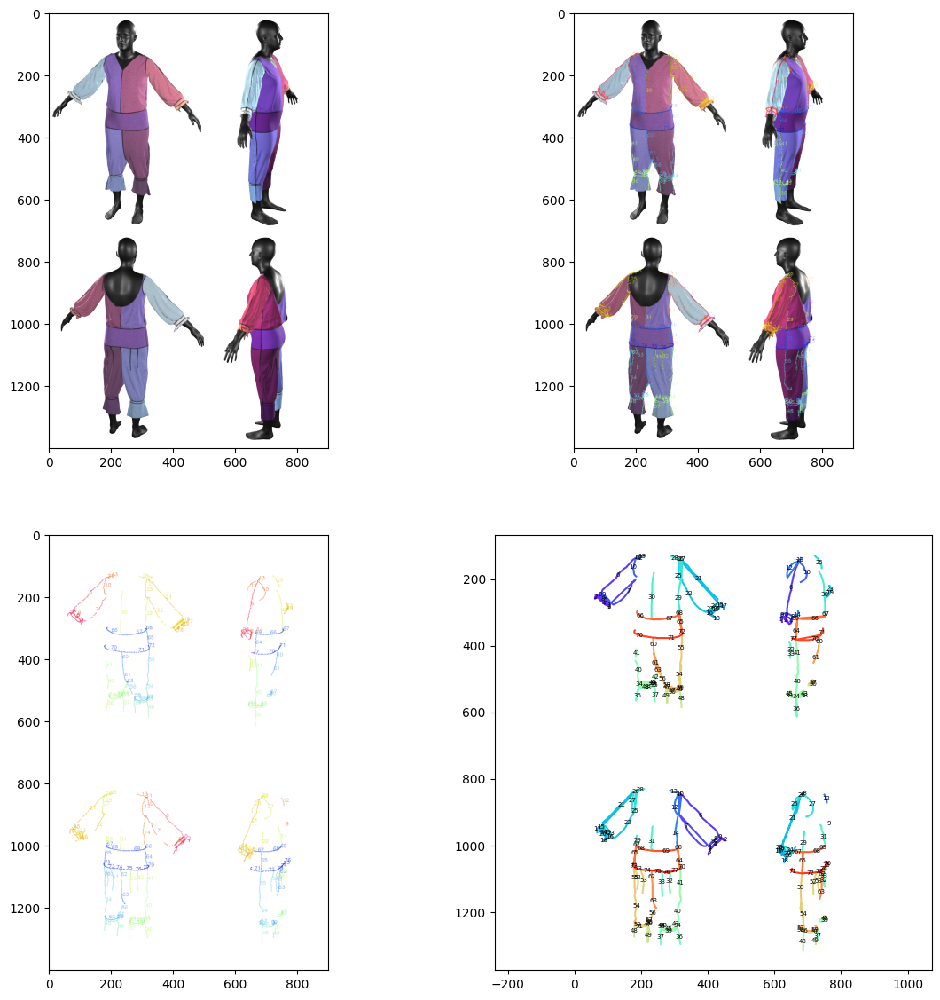

In [10]:

colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_stitch_indices)))
color_dict = dict(zip(unique_stitch_indices, colors))

NROWS = 2
NCOLS = 2
FIGLEN = 7
plt.figure(figsize=(FIGLEN * NCOLS, FIGLEN * NROWS))
plt.subplot(NROWS, NCOLS, 1)
plt.imshow(final_image)

plt.subplot(NROWS, NCOLS, 2)
plt.imshow(vis_image)

plt.subplot(NROWS, NCOLS, 3)
plt.imshow(vis_image_2)

plt.subplot(NROWS, NCOLS, 4)
for side in render_props["sides"]:
    for stitch_idx, vertices in final_seam_vertices_dict[side].items():
        mid_point = vertices[len(vertices)//2]
        plt.text(
            mid_point[0], mid_point[1], str(stitch_idx), 
            ha='center', va='center', 
            fontsize=5,
            # bbox=dict(facecolor='white', alpha=0.7, edgecolor='none')
        )
        plt.plot(
            np.array(vertices)[:, 0], np.array(vertices)[:, 1], '-',
            color=color_dict[stitch_idx],
            label = f"{side}_{stitch_idx}",
        )
        plt.xlim(0, final_image.shape[1])
        plt.ylim(final_image.shape[0], 0)  # Reversed y-axis to tch image coordinates
plt.axis('equal')


plt.show()


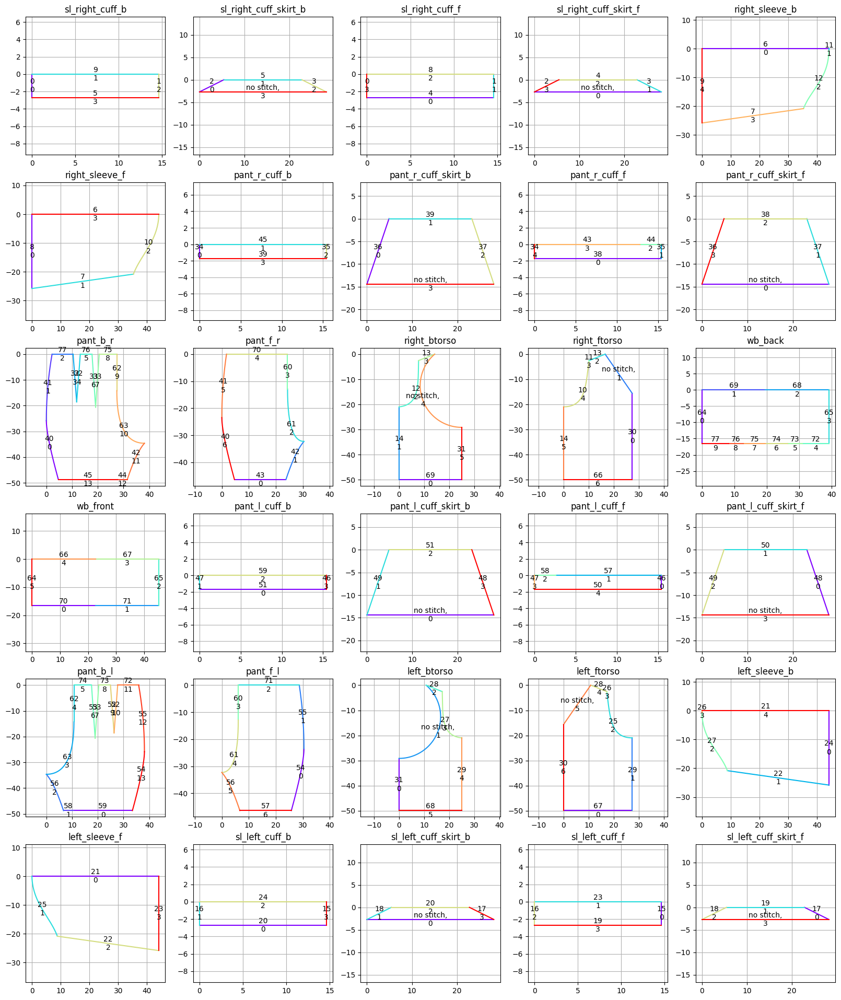

In [19]:
FIGLEN = 4
NCOLS = int(np.sqrt(len(panel_svg_path_dict)))
NROWS = int(np.ceil(len(panel_svg_path_dict) / NCOLS))

plt.figure(figsize=(FIGLEN * NCOLS, FIGLEN * NROWS))
for i, (panel_name, panel) in enumerate(panel_svg_path_dict.items()):
    ax = plt.subplot(NROWS, NCOLS, i + 1)
    ax.set_title(panel_name)
    plot_panel_info(
        ax, panel_name, panel_svg_path_dict, stitch_dict,
        N_SAMPLES=1000
    )
plt.show()

In [45]:

# SIDE_LIST = ["front", "right", "back", "left"]
# render_props["sides"] = SIDE_LIST

# X_MIN_LIST = [150, 200, 150, 200]
# WIDTH_LIST = [500, 400, 500, 400]
# # XMAX_LIST = [650, 600, 650, 600]
# Y_MIN_LIST = [100, 100, 100, 100]
# HEIGHT_LIST = [700, 700, 700, 700]
# # YMAX_LIST = [800, 800, 800, 800]

# X_OFFSET_LIST = [0, 500, 0, 500]
# Y_OFFSET_LIST = [0, 0, 700, 700]



# BODY_TYPE = "default_body"

# PROJECT_ROOT_PATH = "/media/hjp/05aba9a7-0e74-4e54-9bc9-5f11b9c4c757/GarmentCodeData/"
# GARMENT_ROOT_PATH = os.path.join(PROJECT_ROOT_PATH, "GarmentCodeData_v2")

# garment_path_list = sorted(list(filter(
#     os.path.isdir,
#     glob(os.path.join(GARMENT_ROOT_PATH, "*", BODY_TYPE, "*"))
# )))

# GARMENT_IDX = 0

# garment_path = garment_path_list[GARMENT_IDX]
# garment_path = "/media/hjp/05aba9a7-0e74-4e54-9bc9-5f11b9c4c757/GarmentCodeData/GarmentCodeData_v2/garments_5000_0/default_body/rand_0AAY3NQH8J"
# garment_id = os.path.basename(garment_path)


# SPEC_FILE_PATH = os.path.join(garment_path, f"{garment_id}_specification.json")

# pattern = pyg.pattern.wrappers.VisPattern(SPEC_FILE_PATH)

# panel_svg_path_dict = {
#     panel_name : pattern._draw_a_panel(
#         panel_name, apply_transform=False, fill=True
#     )
#     for panel_name in pattern.panel_order()
# }
# stitch_dict = {
#     i : v for i, v in enumerate(pattern.pattern['stitches'])
# }

# rendered_image_list = list(map(
#     lambda x : Image.open(os.path.join(garment_path, f"{garment_id}_render_{x}.png")),
#     render_props["sides"]
# ))

# final_image = np.vstack([
#     np.hstack([
#         np.array(rendered_image_list[0])[Y_MIN_LIST[0]:Y_MIN_LIST[0] + HEIGHT_LIST[0], X_MIN_LIST[0]:X_MIN_LIST[0] + WIDTH_LIST[0]],
#         np.array(rendered_image_list[1])[Y_MIN_LIST[1]:Y_MIN_LIST[1] + HEIGHT_LIST[1], X_MIN_LIST[1]:X_MIN_LIST[1] + WIDTH_LIST[1]]
#     ]),
#     np.hstack([
#         np.array(rendered_image_list[2])[Y_MIN_LIST[2]:Y_MIN_LIST[2] + HEIGHT_LIST[2], X_MIN_LIST[2]:X_MIN_LIST[2] + WIDTH_LIST[2]], 
#         np.array(rendered_image_list[3])[Y_MIN_LIST[3]:Y_MIN_LIST[3] + HEIGHT_LIST[3], X_MIN_LIST[3]:X_MIN_LIST[3] + WIDTH_LIST[3]]
#     ])
# ])
# vis_image = final_image.copy()

# VISIBLE_SEAM_VERTEX_POSITION_DICT_PATH = os.path.join(
#     garment_path, "visible_seam_vertex_position_dict.pkl"
# )
# visible_seam_vertices_dict = pickle.load(open(VISIBLE_SEAM_VERTEX_POSITION_DICT_PATH, "rb"))

# final_seam_vertices_dict = {}
# final_seam_vertices_dict_1000_norm = {}

# unique_stitch_indices = list(visible_seam_vertices_dict.keys())
# colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_stitch_indices)))

# unique_color_list = (colors[:, [2, 1, 0, 3]] * 255).astype(np.uint8)  # [:, :3] removes alpha, [:, ::-1] converts RGB to BGR;

# for side_idx, side in enumerate(render_props["sides"]):
    
#     bbox_width = WIDTH_LIST[side_idx]
#     bbox_height = HEIGHT_LIST[side_idx]
    
#     x_offset = X_OFFSET_LIST[side_idx]
#     y_offset = Y_OFFSET_LIST[side_idx]
    
#     x_min = X_MIN_LIST[side_idx]
#     y_min = Y_MIN_LIST[side_idx]
    
#     final_seam_vertices_dict[side] = {}
#     final_seam_vertices_dict_1000_norm[side] = {}
    
#     for stitch_idx, visible_info in visible_seam_vertices_dict.items():
#         if visible_info[side] is not None and len(visible_info[side]) > 0:
    
#             pixel_coords = visible_info[side] - np.array([x_min, y_min]) + np.array([x_offset, y_offset])
            
#             final_seam_vertices_dict[side][stitch_idx] = pixel_coords.astype(np.int32).tolist()
#             final_seam_vertices_dict_1000_norm[side][stitch_idx] = np.around(
#                 pixel_coords / np.array([final_image.shape[1], final_image.shape[0]]) * 1000,
#                 decimals=0
#             ).astype(np.int32).tolist()
            
#             cv2.putText(
#                 vis_image,
#                 str(stitch_idx),
#                 org=pixel_coords.mean(axis=0).astype(np.int32),  # Offset text slightly from point
#                 fontFace=cv2.FONT_HERSHEY_SIMPLEX,
#                 fontScale=0.5,
#                 color=unique_color_list[stitch_idx].tolist(),
#                 thickness=1
#             )
            
#             # Draw circles and text for each point
#             for point in pixel_coords:
#                 x, y = point
#                 # Draw circle
#                 cv2.circle(
#                     vis_image, 
#                     center=(x, y),
#                     radius=3,
#                     color=unique_color_list[stitch_idx].tolist(),
#                     thickness=-1  # Filled circle
#                 )


# plt.figure(figsize=(40, 20))
# plt.subplot(1, 2, 1)
# plt.imshow(final_image)

# plt.subplot(1, 2, 2)
# plt.imshow(vis_image)

# plt.show()